# Cryptocurrency optimization project

In [427]:

# https://min-api.cryptocompare.com/data/histohour?fsym=NEO&tsym=USD&limit=6000&aggregate=1

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import json
from bs4 import BeautifulSoup
import requests
from datetime import datetime, date, time, timedelta
import sched
import time as mod_time
from pandas.io.json import json_normalize
from sklearn import preprocessing
import scipy.optimize as sco
import seaborn as sns

sns.set(style="darkgrid")
%matplotlib inline




In [428]:
url = "https://api.coinmarketcap.com/v1/ticker/"
response = requests.get(url)
soup = BeautifulSoup(response.content, "html.parser")
dic = json.loads(soup.prettify())

# create an empty DataFrame
df = pd.DataFrame(columns=["Ticker", "MarketCap"])
 
for i in range(len(dic)):
    df.loc[len(df)] = [dic[i]['symbol'], dic[i]['market_cap_usd']]
 
df.sort_values(by=['MarketCap'])
P = df.iloc[:500]
P.head()
tickers = P['Ticker'].tolist()
tickers.append('IOTA')

In [429]:
#https://min-api.cryptocompare.com/data/histoday?fsym=BTC&tsym=USD&limit=60&aggregate=3&e=CCCAGG,
fysm = 'BTC'
tsym = 'USD'
d = json.loads(requests.get('https://min-api.cryptocompare.com/data/histohour?fsym=%s&tsym=%s&limit=6000&aggregate=1' % (fysm ,tsym)).text)
json_normalize(d)
df_BTC = pd.DataFrame(d['Data'])
#df_BTC['time'] =  pd.to_datetime(df_BTC['time'],unit='s')
df_BTC.set_index('time', drop=False, inplace=True)
df_BTC['BTC'] = df_BTC['close']
df_BTC = df_BTC[['BTC', 'time']] 

#df['time'] =  pd.to_datetime(df['time'],unit='s')
adding = 68
count = 0

for fysm in tickers: 
    if fysm == 'BTC':
        adding += 1
        print adding
    else:
        try:
            d = json.loads(requests.get('https://min-api.cryptocompare.com/data/histohour?fsym=%s&tsym=%s&limit=6000&aggregate=1' % (fysm, 'USD')).text)
            json_normalize(d)
            df = pd.DataFrame(d['Data'])
            df.set_index('time', drop=True, inplace=True)
            df_BTC[fysm] = df['close']
        except:
            print fysm
            continue
    

df_BTC.head()
df_BTC['time'] =  pd.to_datetime(df_BTC['time'],unit='s')
df_BTC.set_index('time', drop=True, inplace=True)
df_BTC.to_clipboard()

69
MIOTA
GXS


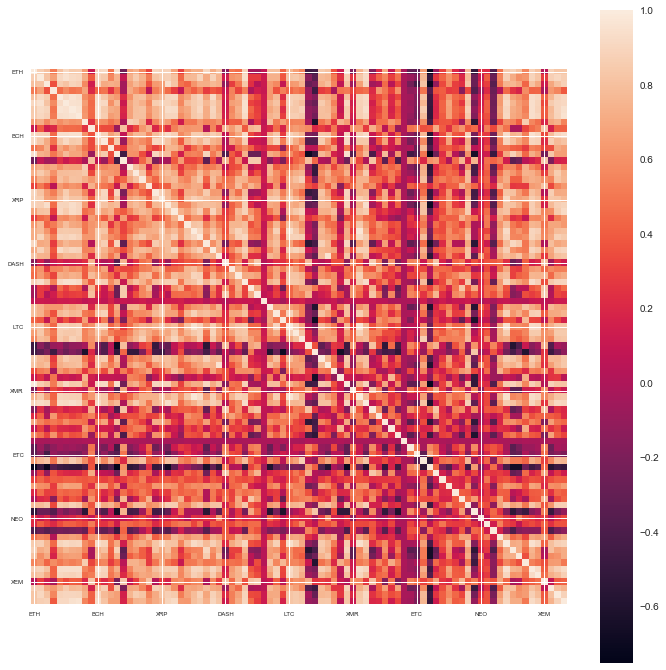

In [532]:
def correlation_matrix(df):
    from matplotlib import cm as cm
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #cmap = cm.get_cmap('jet', 50)
    cax = ax1.imshow(df.corr(), interpolation="nearest")
    ax1.grid(True)
    labels=df.columns
    ax1.set_xticklabels(labels,fontsize=6)
    ax1.set_yticklabels(labels,fontsize=6)
    # Add colorbar, make sure to specify tick locations to match desired ticklabels
    fig.colorbar(cax)
    plt.show()

correlation_matrix(df)


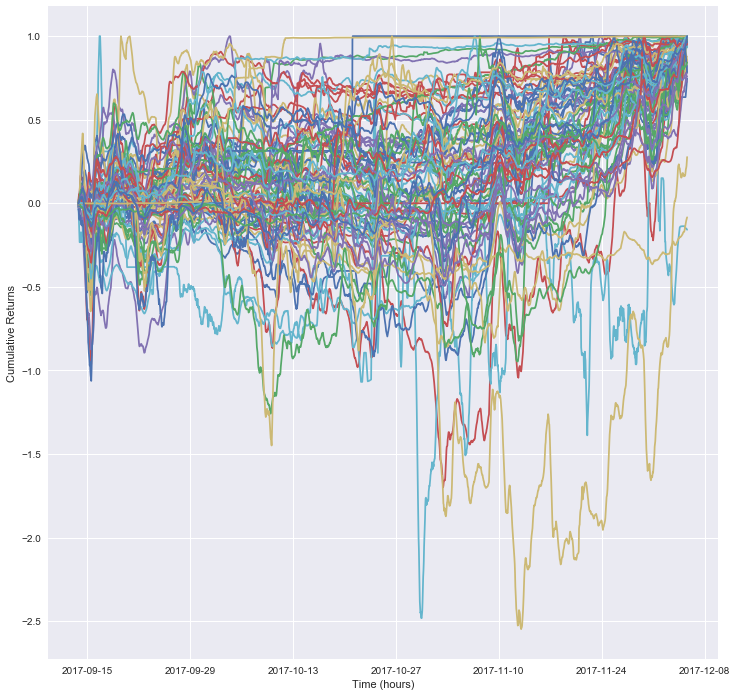

In [497]:
df_unscaled = df_BTC.loc[:, (df_BTC.iloc[1] != 0)]

df_temp = df_unscaled.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
df_scaled = min_max_scaler.fit_transform(df_temp)
df = pd.DataFrame(df_scaled, columns=df_unscaled.columns)
df = df.drop(['USDT','GNT'], axis=1)


cum = df_unscaled.pct_change(12)[12:]
cum = cum.cumsum()
cum.to_clipboard()

cum = cum.apply(lambda x: x / max(x))

cum = cum.loc[:,(cum.applymap(lambda x: x > -5).all(axis=0) == True)]

plt.figure(figsize=(12, 12))
plt.plot(cum)
#plt.title('Scaled Currency cummulative returns')
plt.xlabel('Time (hours)')
plt.ylabel('Cumulative Returns')

## VAR Model 

In [431]:
from statsmodels.tsa.api import VAR, DynamicVAR
import pyflux as pf

In [557]:
y = pf.VAR(data=df, lags=3, integ=1, )
x = y.fit()
x.summary()

VAR(3)                                                                                                    
======================================================= ==================================================
Dependent Variable: Differenced BTC,Differenced ETH,Dif Method: OLS                                       
Start Date: 3                                           Log Likelihood: 464269.8047                       
End Date: 2000                                          AIC: -878895.6094                                 
Number of observations: 1997                            BIC: -739907.2695                                 
Latent Variable                          Estimate   Std Error  z        P>|z|    95% C.I.                 
======================================== ========== ========== ======== ======== =========================
Differenced BTC Constant                 0.0005     0.0002     2.675    0.0075   (0.0001 | 0.0008)        
Differenced BTC AR(1)                

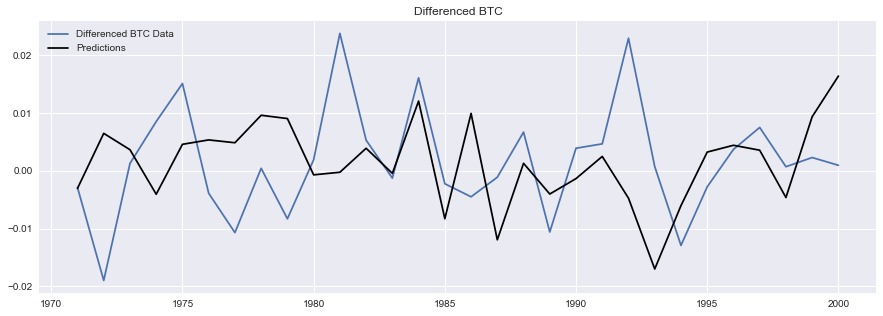

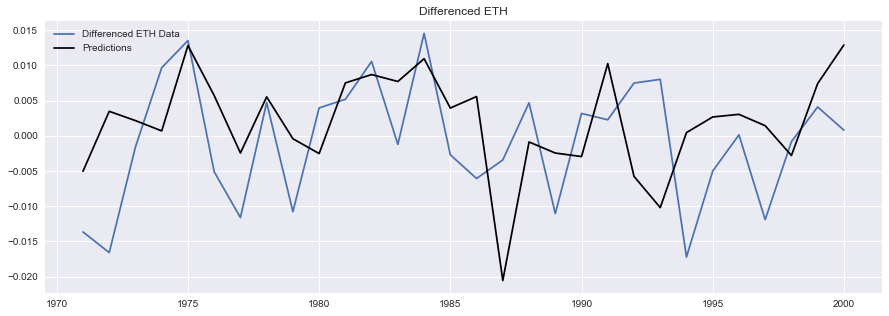

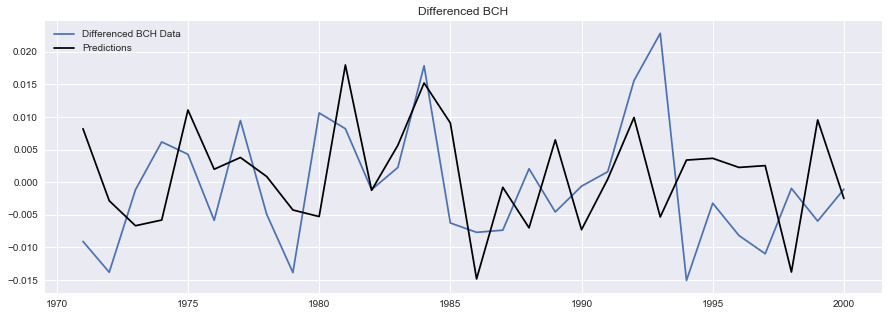

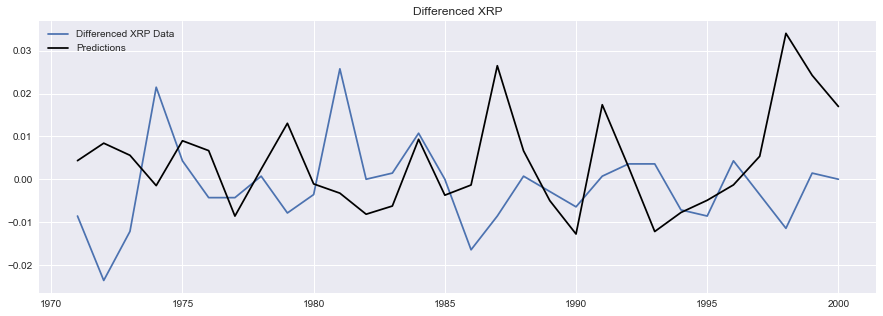

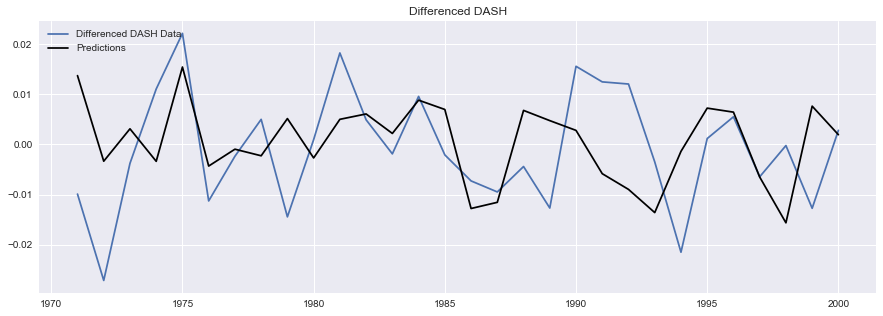

...

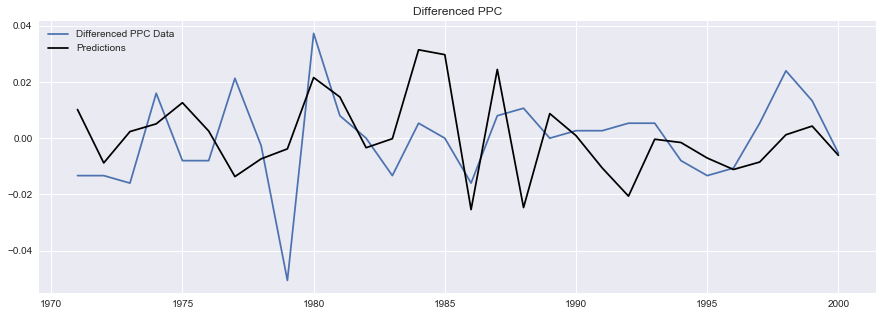

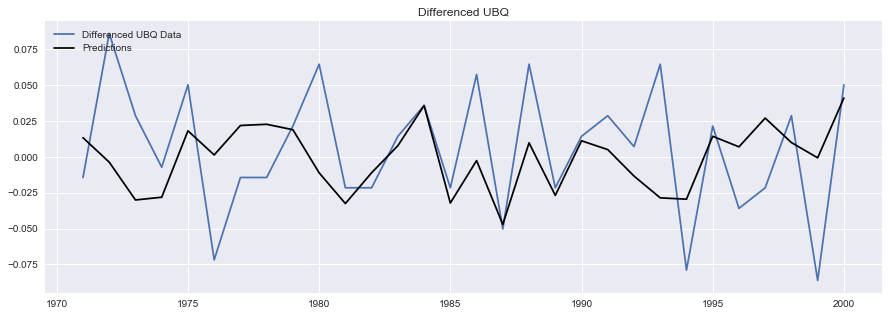

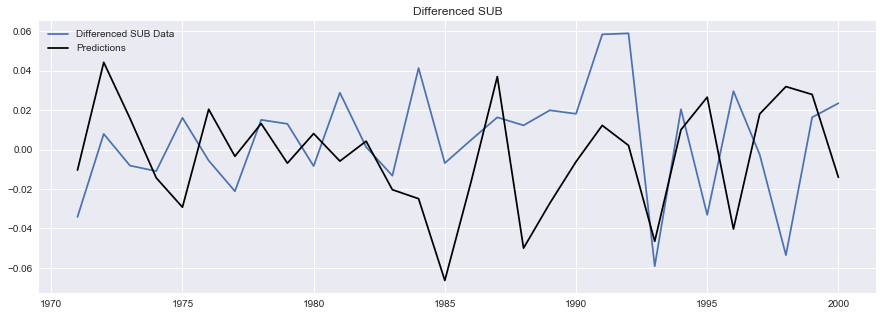

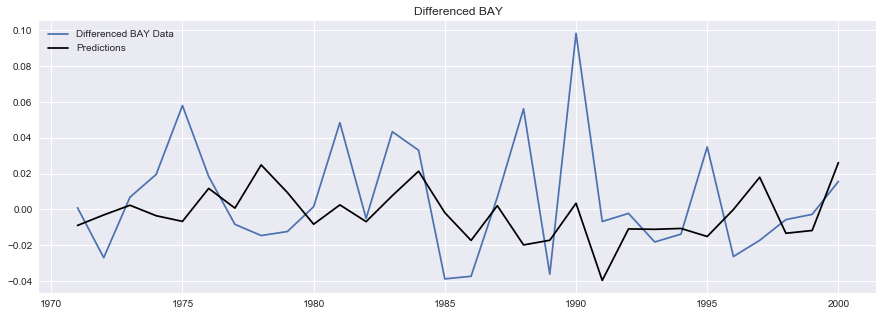

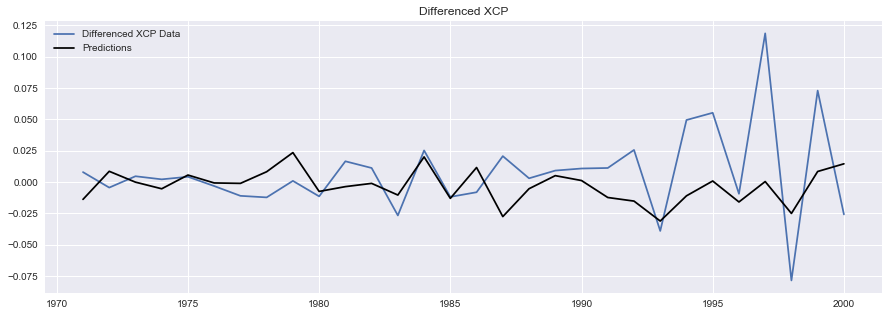

In [433]:
y.plot_predict_is(h=30, figsize=((15,5)))

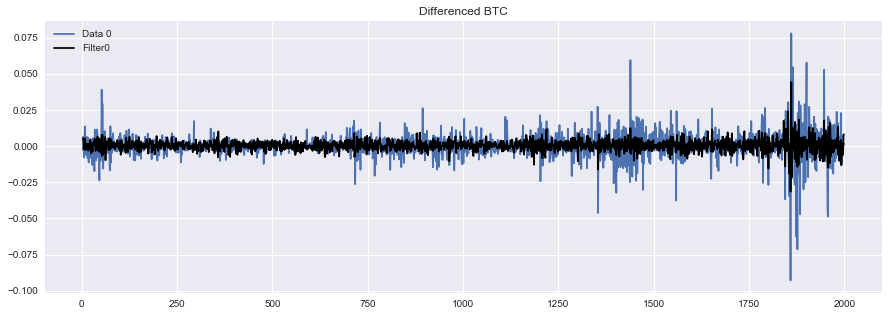

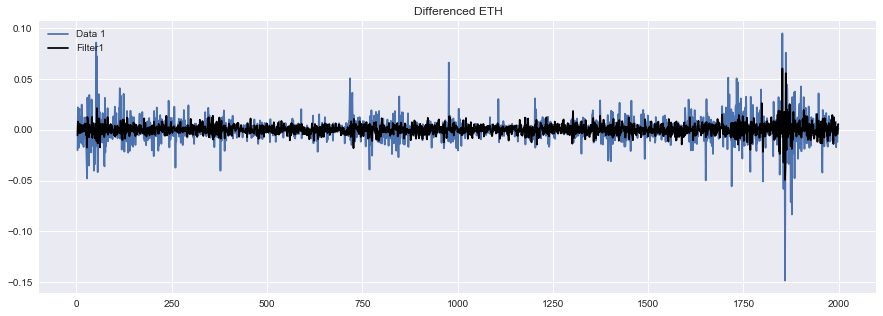

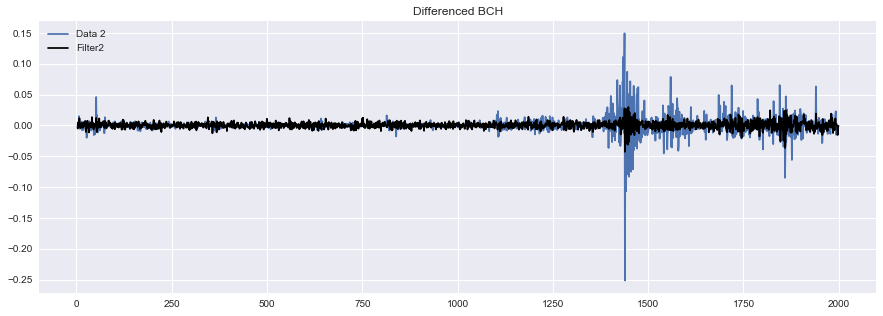

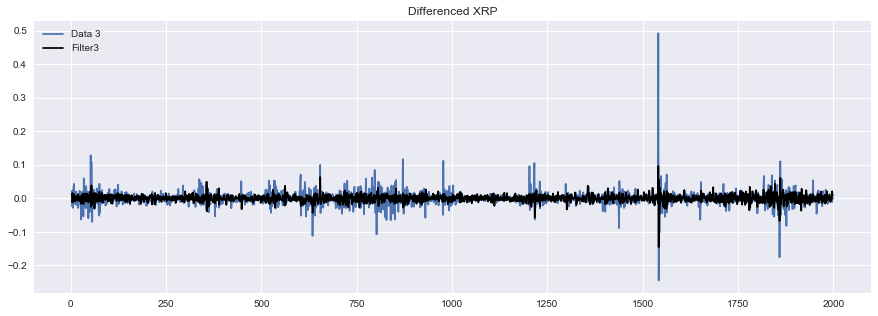

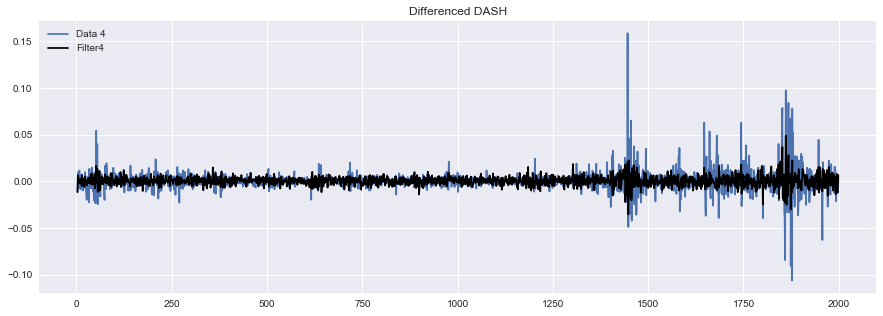

...

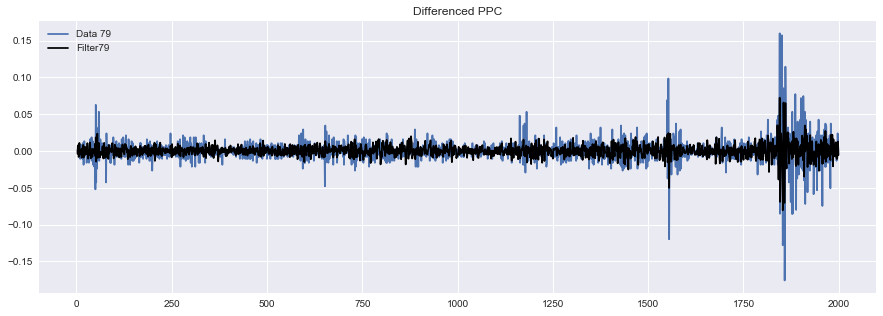

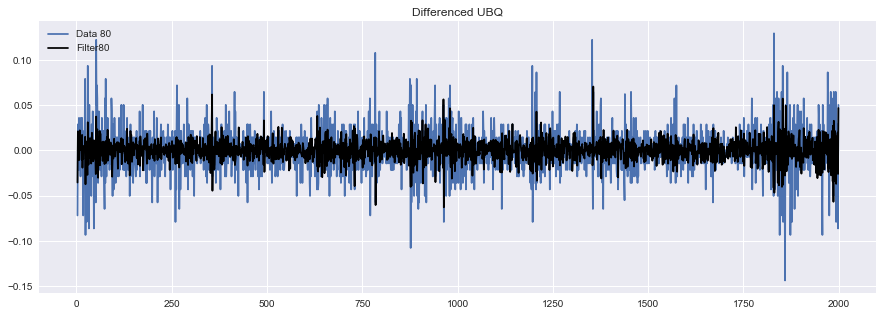

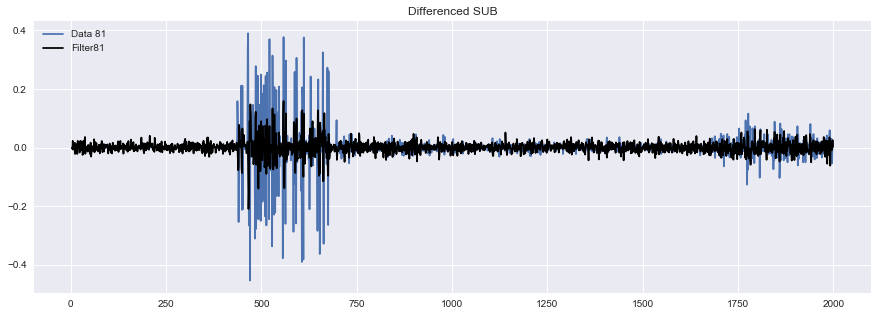

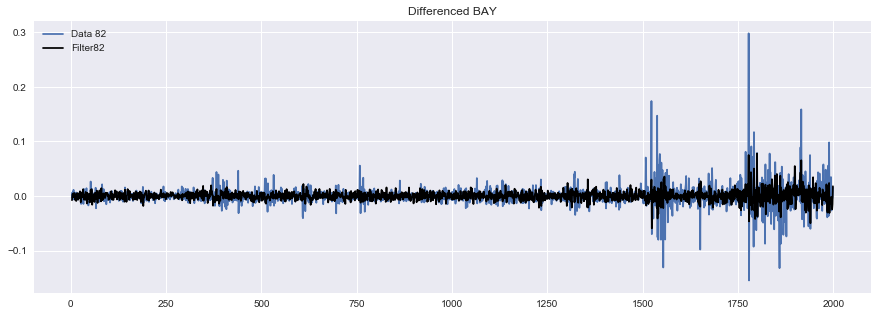

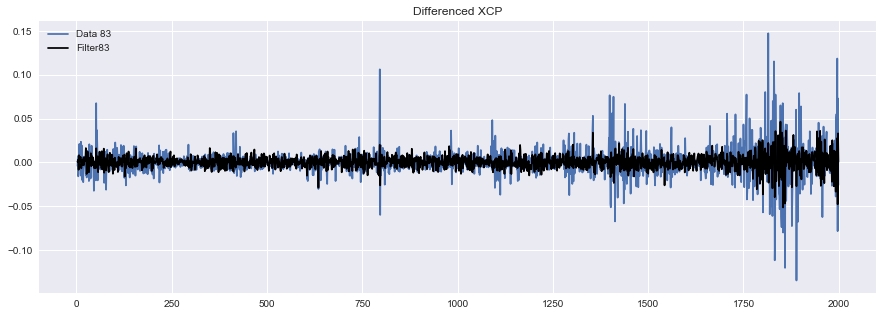

In [564]:
y.plot_fit(figsize=(15,5))

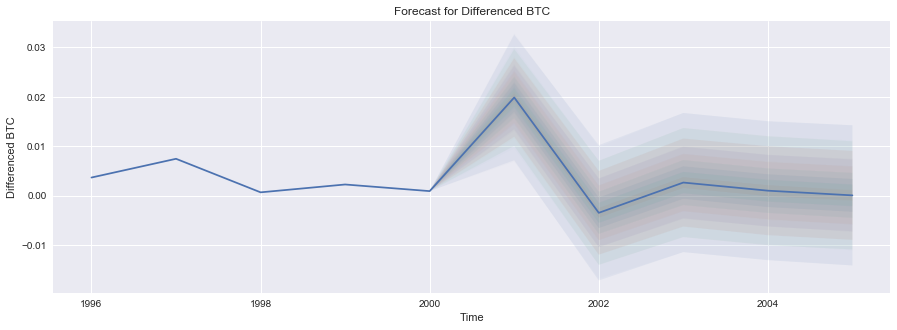

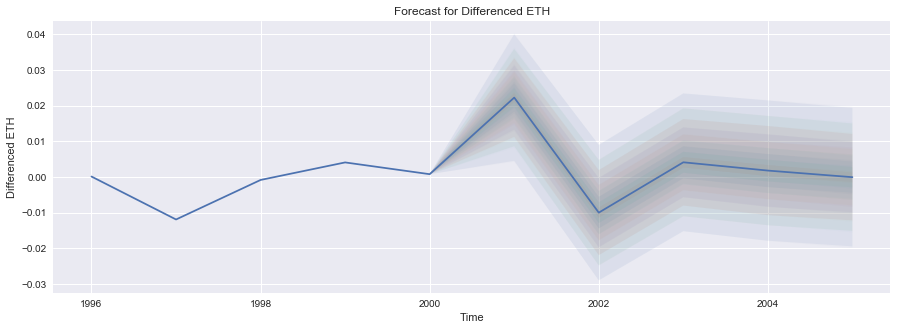

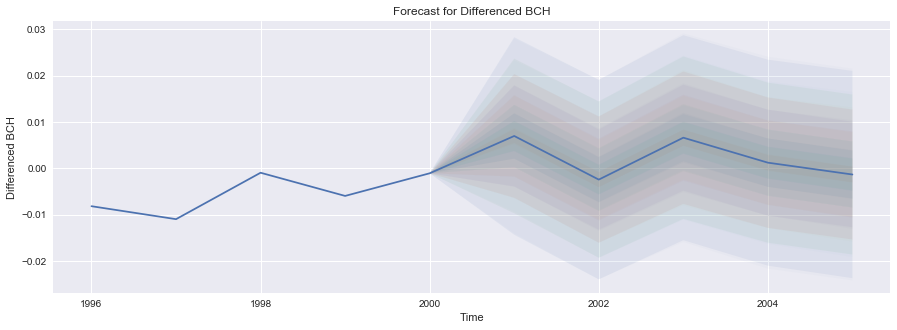

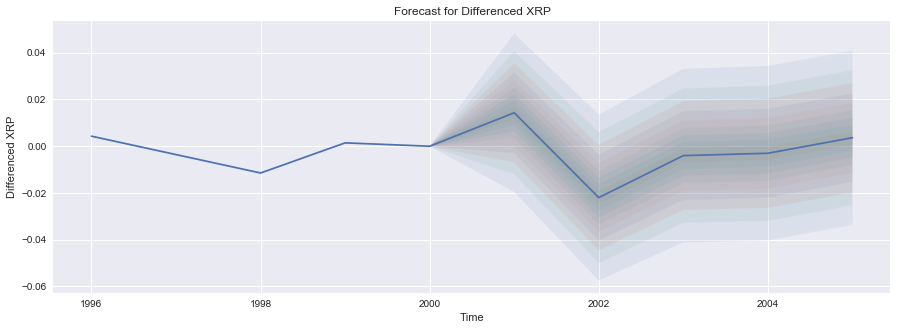

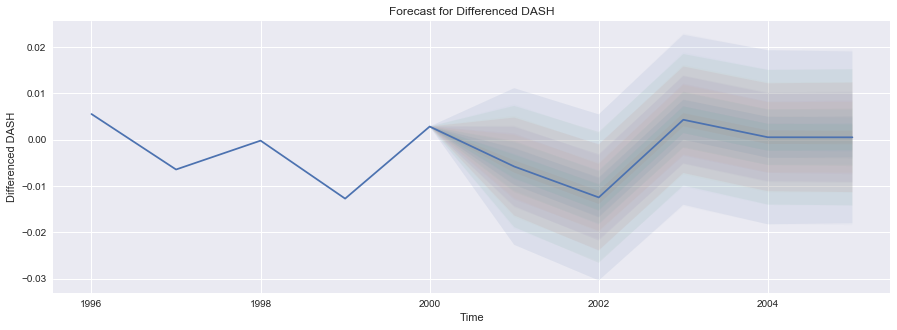

...

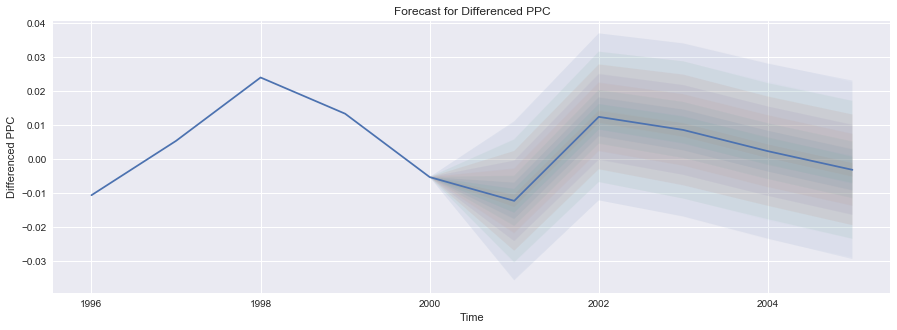

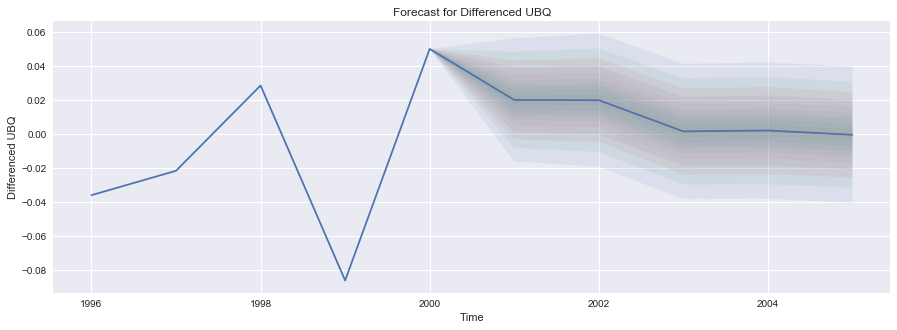

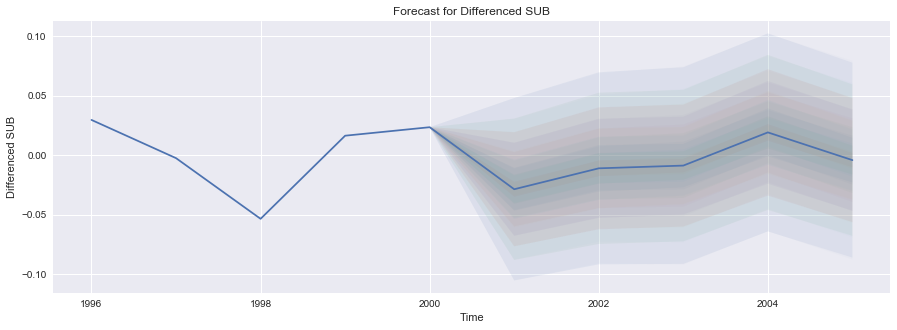

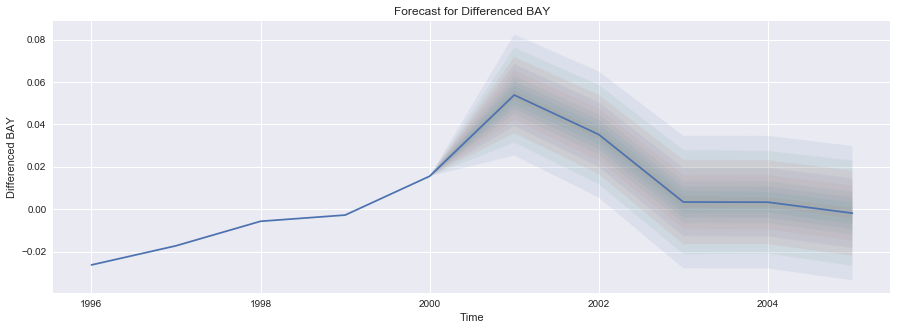

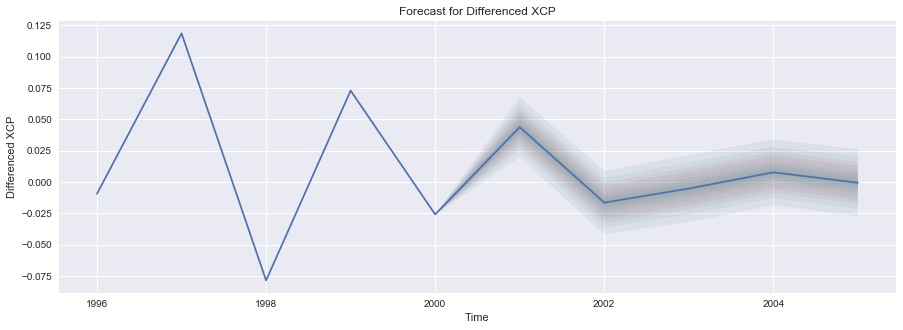

In [533]:
y.plot_predict(past_values=5, h=5, figsize=(15,5))

In [558]:
df_predict = y.predict(h=6)
df_pct_change = df.pct_change(1)[1:]

## Portfolio Theory

## Portfolio Optimization


# Working

In [559]:
stocks = df_predict.columns
returns = df_predict


In [560]:
#calculate mean daily return and covariance of daily returns
mean_daily_returns = returns.mean()
cov_matrix = returns.cov()
#set number of runs of random portfolio weights
num_portfolios = 25000
 
#set up array to hold results
#We have increased the size of the array to hold the weight values for each stock
results = np.zeros((4+len(df.columns)-1,num_portfolios))
results

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [561]:
for i in xrange(num_portfolios):
    #select random weights for portfolio holdings
    weights = np.array(np.random.random(len(df.columns)))
    #rebalance weights to sum to 1
    weights /= np.sum(weights)
 
    #calculate portfolio return and volatility
    portfolio_return = np.sum(mean_daily_returns * weights) * 365 * 2
    portfolio_std_dev = np.sqrt(np.dot(weights.T,np.dot(cov_matrix, weights))) * np.sqrt(365 * 2)
 
    #store results in results array
    results[0,i] = portfolio_return
    results[1,i] = portfolio_std_dev
    #store Sharpe Ratio (return / volatility) - risk free rate element excluded for simplicity
    results[2,i] = results[0,i] / results[1,i]
    #iterate through the weight vector and add data to results array
    for j in range(len(weights)):
        results[j+3,i] = weights[j]



###  Something isnt working here.

Need to figure out why distribution is off. We should see an efficient frontier. 

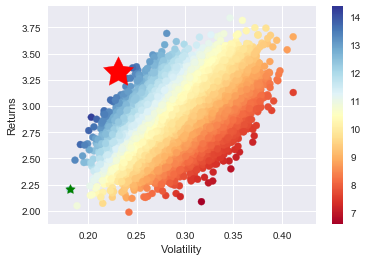

In [562]:
cols = ['ret','stdev','sharpe']
for i in stocks:
    cols.append(i)
cols
# convert results array to Pandas DataFrame
results_frame = pd.DataFrame(results.T,columns=[cols])
 
#locate position of portfolio with highest Sharpe Ratio
max_sharpe_port = results_frame.iloc[results_frame['sharpe'].idxmax()]
#locate positon of portfolio with minimum standard deviation
min_vol_port = results_frame.iloc[results_frame['stdev'].idxmin()]
 
#create scatter plot coloured by Sharpe Ratio
plt.scatter(results_frame.stdev,results_frame.ret,c=results_frame.sharpe,cmap='RdYlBu')
plt.xlabel('Volatility')
plt.ylabel('Returns')
plt.colorbar()
#plot red star to highlight position of portfolio with highest Sharpe Ratio
plt.scatter(max_sharpe_port[1],max_sharpe_port[0],marker=(5,1,0),color='r',s=1000)
#plot green star to highlight position of minimum variance portfolio
plt.scatter(min_vol_port[1],min_vol_port[0],marker=(5,1,0),color='g',s=100)

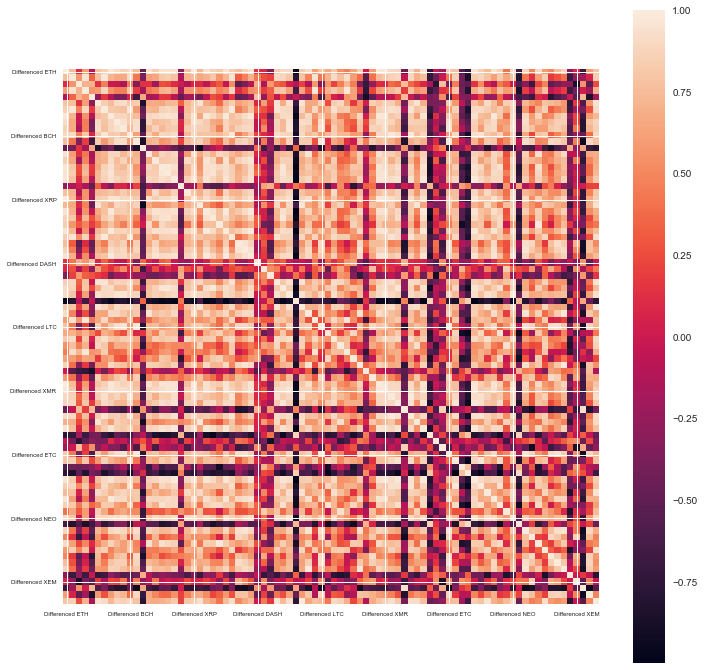

In [563]:
correlation_matrix(df_predict)

# Theory

In [9]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import cvxopt as opt
from cvxopt import blas, solvers
import pandas as pd
import seaborn as sns
sns.set(style="darkgrid")
%matplotlib inline
np.random.seed(123)

# Turn off progress printing 
solvers.options['show_progress'] = False

In [10]:
## NUMBER OF ASSETS
n_assets = 4

## NUMBER OF OBSERVATIONS
n_obs = 1000

return_vec = np.random.randn(n_assets, n_obs)

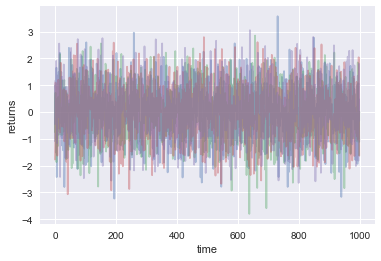

In [11]:
plt.plot(return_vec.T, alpha=.4);
plt.xlabel('time')
plt.ylabel('returns')

In [12]:
def rand_weights(n):
    ''' Produces n random weights that sum to 1 '''
    k = np.random.rand(n)
    return k / sum(k)

print rand_weights(n_assets)
print rand_weights(n_assets)

[ 0.54066805  0.2360283   0.11660484  0.1066988 ]
[ 0.27638339  0.03006307  0.47850085  0.21505269]


In [13]:
def random_portfolio(returns):
    ''' 
    Returns the mean and standard deviation of returns for a random portfolio
    '''

    p = np.asmatrix(np.mean(returns, axis=1))
    w = np.asmatrix(rand_weights(returns.shape[0]))
    C = np.asmatrix(np.cov(returns))
    
    mu = w * p.T
    sigma = np.sqrt(w * C * w.T)
    
    # This recursion reduces outliers to keep plots pretty
    if sigma > 2:
        return random_portfolio(returns)
    return mu, sigma

In [6]:
n_portfolios = 500
means, stds = np.column_stack([
    random_portfolio(return_vec) 
    for _ in xrange(n_portfolios)
])

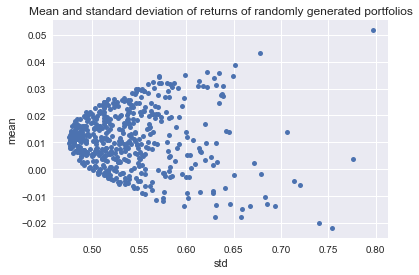

In [14]:
plt.plot(stds, means, 'o', markersize=5)
plt.xlabel('std')
plt.ylabel('mean')
plt.title('Mean and standard deviation of returns of randomly generated portfolios')

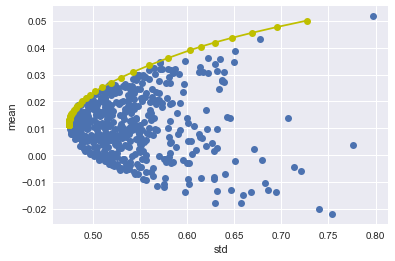

In [15]:
def optimal_portfolio(returns):
    n = len(returns)
    returns = np.asmatrix(returns)
    
    N = 100
    mus = [10**(5.0 * t/N - 1.0) for t in range(N)]
    
    # Convert to cvxopt matrices
    S = opt.matrix(np.cov(returns))
    pbar = opt.matrix(np.mean(returns, axis=1))
    
    # Create constraint matrices
    G = -opt.matrix(np.eye(n))   # negative n x n identity matrix
    h = opt.matrix(0.0, (n ,1))
    A = opt.matrix(1.0, (1, n))
    b = opt.matrix(1.0)
    
    # Calculate efficient frontier weights using quadratic programming
    portfolios = [solvers.qp(mu*S, -pbar, G, h, A, b)['x'] 
                  for mu in mus]
    ## CALCULATE RISKS AND RETURNS FOR FRONTIER
    returns = [blas.dot(pbar, x) for x in portfolios]
    risks = [np.sqrt(blas.dot(x, S*x)) for x in portfolios]
    ## CALCULATE THE 2ND DEGREE POLYNOMIAL OF THE FRONTIER CURVE
    m1 = np.polyfit(returns, risks, 2)
    x1 = np.sqrt(m1[2] / m1[0])
    # CALCULATE THE OPTIMAL PORTFOLIO
    wt = solvers.qp(opt.matrix(x1 * S), -pbar, G, h, A, b)['x']
    return np.asarray(wt), returns, risks

weights, returns, risks = optimal_portfolio(return_vec)

plt.plot(stds, means, 'o')
plt.ylabel('mean')
plt.xlabel('std')
plt.plot(risks, returns, 'y-o')

# Not Working / for future

In [348]:
df_predict.columns = df_pct_change.columns
returns = pd.concat([df_pct_change, df_predict])
sum(df_predict.cumsum().loc[2024])

return_vec = np.array(returns)
return_vec

array([[ -6.39442406e-03,   5.15680909e-03,  -4.19704784e-03, ...,
          1.83765502e-01,   1.09110747e-02,  -1.60205062e-02],
       [ -1.16081700e-02,   9.42309706e-03,  -1.53945066e-02, ...,
         -2.00000000e-02,   1.76290700e-01,  -1.62813416e-02],
       [  2.19426041e-02,   2.40638938e-02,   9.17797287e-03, ...,
         -9.32944606e-02,   6.88178621e-02,  -8.27540549e-02],
       ..., 
       [ -1.89778117e-03,  -3.83969390e-03,  -4.09432337e-03, ...,
         -9.78165212e-03,   2.41204959e-05,  -6.84437885e-03],
       [  6.01283676e-04,   1.60781338e-03,   2.74392905e-03, ...,
          8.47864497e-03,  -3.66283737e-03,  -5.46467490e-03],
       [  3.49936744e-04,   2.39475714e-04,   1.90576910e-03, ...,
         -5.03300384e-03,   2.13432189e-03,   2.53423217e-03]])

In [310]:
symbols = df_predict.columns
noa = len(symbols)
weights = np.random.random(noa)
weights /= np.sum(weights)
len(weights)

81

In [311]:

np.sum(df_predict.mean() * weights) * 24

0.0721145130718721

In [312]:
np.dot(weights.transpose(), np.dot(df_predict.cov() * 24, weights))

0.011354211414463848

In [314]:
prets = []
pvols = []

for p in range(25000):
    weights = np.random.random(noa)
    weights /= np.sum(weights)
    prets.append(np.sum(df_predict.mean() * weights) * 24)
    pvols.append(np.dot(weights.transpose(), np.dot(df_predict.cov() * 24, weights)))
prets = np.array(prets)
pvols = np.array(pvols)



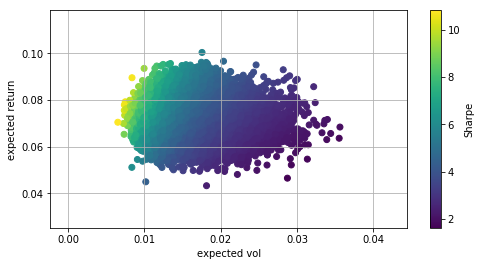

In [315]:
plt.figure(figsize=(8, 4))
plt.scatter(pvols, prets, c= prets / pvols, marker='o')
plt.grid(True)
plt.xlabel('expected vol')
plt.ylabel('expected return')
plt.colorbar(label='Sharpe')

In [324]:
def statistics(weights):
    ''' Returns portfolio statistics
    
    Parameters
    ==========
    weights : array-like
        weights for diffeerent securities in portfolio
    
    Returns
    =========
    pret: float
        expected portfolio return
    pvol : float
        expected portfolio vol
    pret / pvol : float
        Sharpe ratio for rf=0
    
    '''
    weights = np.array(weights)
    pret = np.sum(df_predict.mean() * weights) * 24
    pvol = np.dot(weights.transpose(), np.dot(df_predict.cov() * 24, weights))
    return np.array([pret, pvol, pret / pvol])

def min_func_sharpe(weights):
    '''minimizes the negative value of the sharpe ratio'''
    return -statistics(weights)[2]

def min_func_variance(weights):
    return statistics(weights)[1] ** 2

def min_func_port(weights):
    return statistics(weights)[1]

In [325]:
#'''all weights add up to one'''

cons = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})

# parameter values must be within 0 and 1
bnds = tuple((0, 1) for x in range(noa))

# equal distribution for starting point
equalweight = noa * [1. / noa]

In [326]:
opts = sco.minimize(min_func_sharpe, noa * [1.0 / noa,], method='SLSQP',
                   bounds=bnds, constraints=cons)

In [343]:
sharpes = statistics(opts['x'])


In [344]:
optv = sco.minimize(min_func_variance, noa *[1.0 / noa,], method='SLSQP',
                   bounds=bnds, constraints=cons)

In [345]:
vols = statistics(optv['x'])
print 
print 

In [213]:
trets = np.linspace(0.0, 0.25, 50)
tvols = []
for tret in trets:
    cons = ({'type': 'eq', 'fun': lambda x: statistics(x) - tret},
            {'type': 'eq', 'fun': lambda x: np.sum(x) -1})
    res = sco.minimize(min_func_port, noa * [1. / noa,], method='SLSQP', bounds=bnds, constraints=cons)
    tvols.append(res['fun'])
tvols = np.array(tvols)

KeyboardInterrupt: 

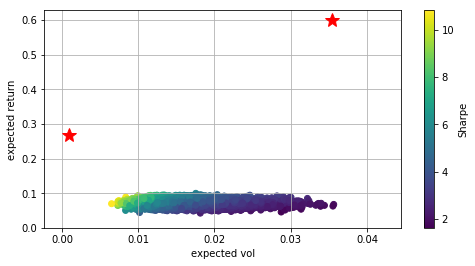

In [342]:
plt.figure(figsize=(8, 4))
plt.scatter(pvols, prets, c= prets / pvols, marker='o')
plt.grid(True)
plt.xlabel('expected vol')
plt.ylabel('expected return')
plt.colorbar(label='Sharpe') 
plt.plot(sharpes[1], sharpes[0], 'r*', markersize=15.0)
plt.plot(vols[1], vols[0], 'r*', markersize=15.0)